In [ ]:
import numpy as np
import pandas as pd
import nltk
import random
import os
from os import path
from PIL import Image
import time
import matplotlib as mpl
mpl.rcParams['font.sans-serif'] = ['SimHei']
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from subprocess import check_output
import missingno as msno
from wordcloud import WordCloud, STOPWORDS
sns.set_palette('rainbow')#调色
import re
import string
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import statsmodels.api as sm
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
from nltk.util import ngrams
from collections import Counter
from gensim.models import word2vec
import warnings
warnings.filterwarnings('ignore')

### 数据来源

In [15]:
df = pd.read_csv("data.csv")
df.drop(df.columns[0],inplace=True, axis=1) #去除第一列索引

###  数据描述

In [16]:
print('预处理前的数据维度大小: ',df.shape)

预处理前的数据维度大小:  (23486, 10)


#### 数据统计性描述

In [17]:
#对于数值型变量
df.describe().T.drop("count",axis=1)

,mean,std,min,25%,50%,75%,max
Clothing ID,918.118709,203.298980,0.0,861.0,936.0,1078.0,1205.0
Age,43.198544,12.279544,18.0,34.0,41.0,52.0,99.0
Rating,4.196032,1.110031,1.0,4.0,5.0,5.0,5.0
Recommended IND,0.822362,0.382216,0.0,1.0,1.0,1.0,1.0
Positive Feedback Count,2.535936,5.702202,0.0,0.0,1.0,3.0,122.0


In [18]:
#对于字符串变量
df.describe(include='O').T.drop("count",axis=1)

,unique,top,freq
Title,13993,Love it!,136
Review Text,22634,Perfect fit and i've gotten so many compliment...,3
Division Name,3,General,13850
Department Name,6,Tops,10468
Class Name,20,Dresses,6319


###  数据预处理

<AxesSubplot:>

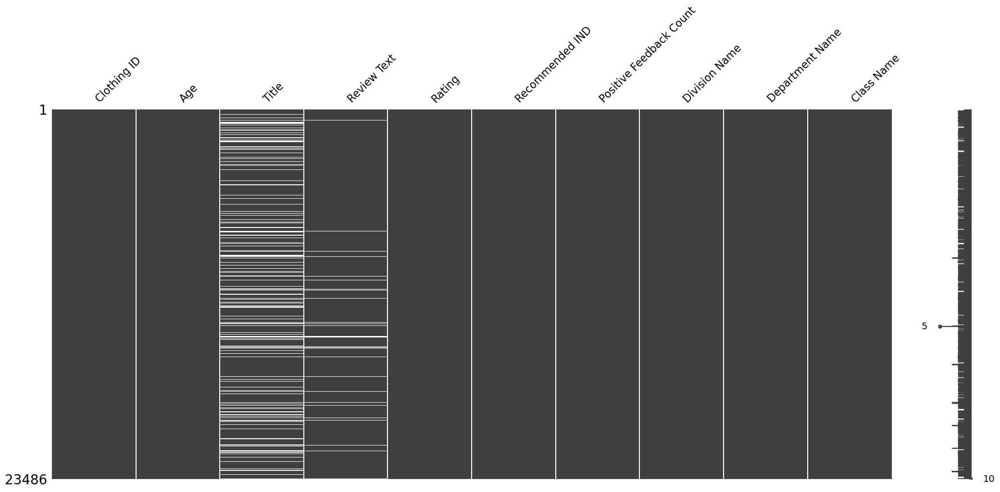

In [66]:
#缺失值描述矩阵图
msno.matrix(df)

<AxesSubplot:>

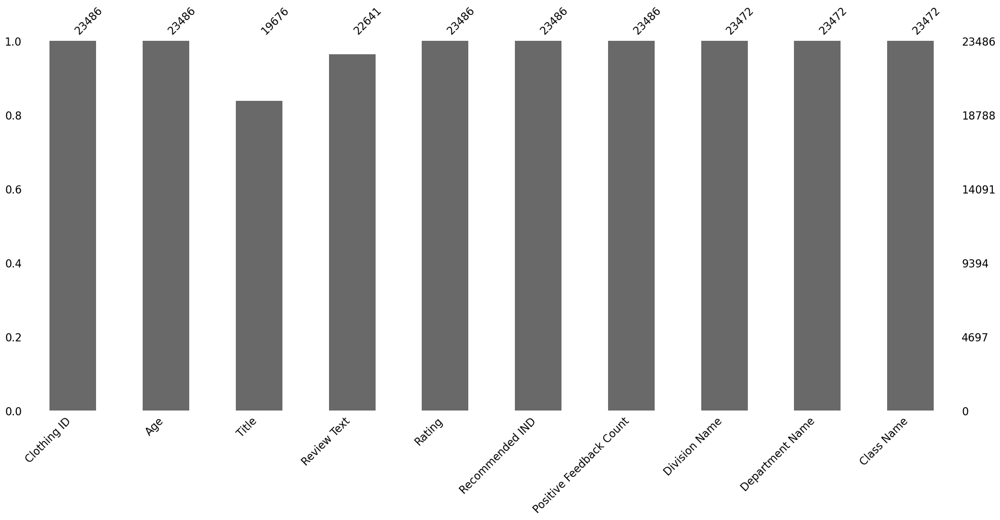

In [57]:
#缺失值柱状图
msno.bar(df)

In [19]:
#缺失值处理
#删除以下列的缺失行
for x in ["Division Name","Department Name","Class Name","Review Text"]:
    df = df[df[x].notnull()]

In [20]:
df.sample(5)

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
5282,404,36,Cute suit but order a size (or two!) up!,"Cute suit over all. cups are lightly padded, w...",4,1,4,Initmates,Intimate,Swim
13785,1070,40,"Pretty, but totally uncomfortable!","I'm 5'8 - 38""?30""?38"" - i bought these legging...",4,0,1,General,Bottoms,Pants
16183,940,35,Lovely basic piece,I found this cardigan/sweater in the sale room...,5,1,3,General Petite,Tops,Sweaters
8964,940,63,Coat,Omg. i also bought this years ago. i have worn...,5,1,4,General,Tops,Sweaters
11331,829,37,Pregnant ladies,"This definitely works for you - think fabric, ...",4,1,0,General,Tops,Blouses


### 特征工程——创造新特征

In [21]:
# 文字长度
df["Word Count"] = df['Review Text'].str.split().apply(len)
# 字符串长度
df["Character Count"] = df['Review Text'].apply(len)
# 好坏标签
df["Label"] = 0
df.loc[df.Rating >= 3,["Label"]] = 1

In [22]:
# 新特征统计性描述
df[['Word Count','Character Count','Label']].describe().T.drop("count",axis=1)

,mean,std,min,25%,50%,75%,max
Word Count,60.211950,28.533053,2.0,36.0,59.0,88.0,115.0
Character Count,308.761534,143.934126,9.0,186.0,302.0,459.0,508.0
Label,0.895263,0.306222,0.0,1.0,1.0,1.0,1.0


### 单变量分布

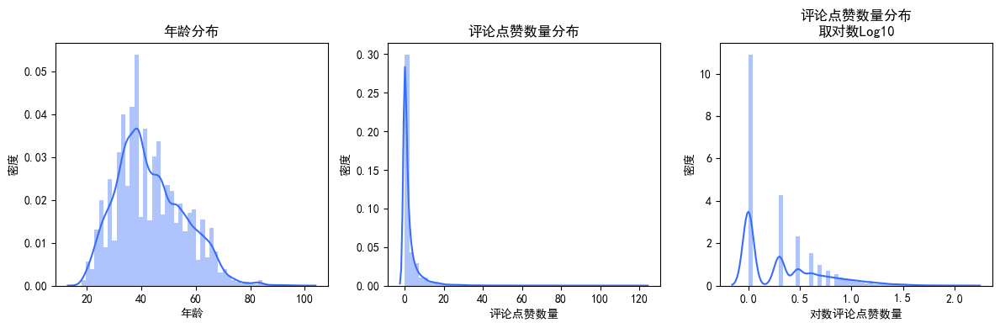

In [105]:
#年龄和评论点赞数的直方图
f, ax = plt.subplots(1,3,figsize=(12,4), sharey=False)
sns.distplot(df.Age, ax=ax[0])
ax[0].set_title("年龄分布")
ax[0].set_xlabel("年龄")
ax[0].set_ylabel("密度")
sns.distplot(df["Positive Feedback Count"], ax=ax[1])
ax[1].set_title("评论点赞数量分布")
ax[1].set_xlabel("评论点赞数量")
ax[1].set_ylabel("密度")
sns.distplot(np.log10((df["Positive Feedback Count"][df["Positive Feedback Count"].notnull()]+1)), ax=ax[2])
ax[2].set_title("评论点赞数量分布\n取对数Log10")
ax[2].set_xlabel("对数评论点赞数量")
ax[2].set_ylabel("密度")
plt.tight_layout()
plt.savefig('HW_yyx_latex/age_positivefeedback.pdf',dpi=600)

前20% 的评论者拥有78% 的点赞量

基尼系数： 0.76


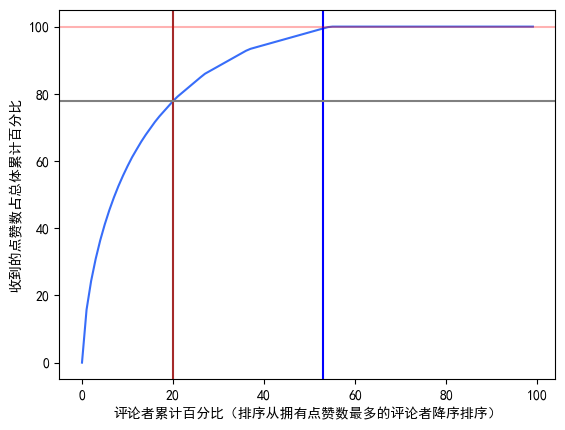

In [104]:
# 二八定律证明
def percentage_accumulation(series, percentage):
    return (series.sort_values(ascending=False)
            [:round(series.shape[0]*(percentage/100))]
     .sum()/series
     .sum()*100)

#基尼系数计算
def gini(list_of_values):
    sorted_list = sorted(list_of_values)
    height, area = 0, 0
    for value in sorted_list:
        height += value
        area += height - value / 2.
    fair_area = height * len(list_of_values) / 2.
    return (fair_area - area) / fair_area

inequality = []
for x in list(range(100)):
    inequality.append(percentage_accumulation(df["Positive Feedback Count"], x))

plt.plot(inequality)
plt.xlabel("评论者累计百分比（排序从拥有点赞数最多的评论者降序排序）")
plt.ylabel("收到的点赞数占总体累计百分比")
plt.axvline(x=20, c = "brown")
plt.axvline(x=53, c = "blue")
plt.axhline(y=78, c = "grey")
plt.axhline(y=100, c = "red", alpha=.3)
plt.savefig('HW_yyx_latex/28.pdf',dpi=600)

print("前20% 的评论者拥有{}% 的点赞量".format(
    round(percentage_accumulation(df["Positive Feedback Count"], 20))))

# 基尼系数
print("\n基尼系数： {}".format(round(gini(df["Positive Feedback Count"]),2)))

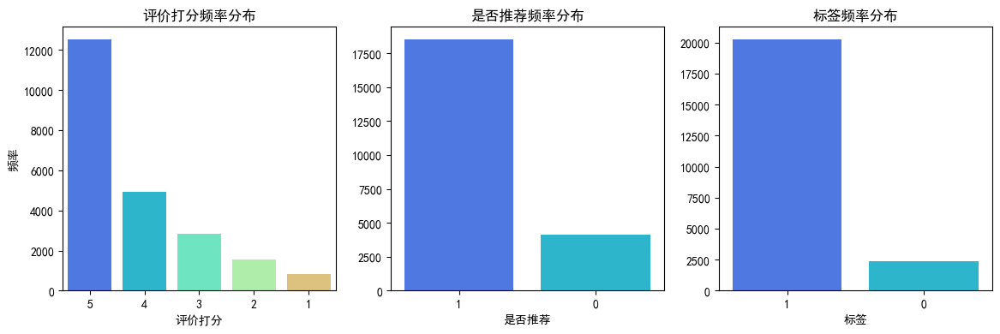

In [103]:
#Rateing-打分、Recommended IND-是否推荐和 Label-标签分布
cat_dtypes = ["Rating","Recommended IND","Label"]
increment = 0
f, axes = plt.subplots(1,len(cat_dtypes), figsize=(14,4), sharex=False)
l1 = ['评价打分','是否推荐','标签']
l2 = ['评价打分频率分布','是否推荐频率分布','标签频率分布']

for i in range(len(cat_dtypes)):
    sns.countplot(x=cat_dtypes[increment], data=df,order=df[cat_dtypes[increment]].value_counts().index, ax=axes[i])
    axes[i].set_title(l2[i])
    axes[i].set_ylabel("频率")
    axes[i].set_xlabel(l1[i])
    increment += 1
axes[1].set_ylabel("")
axes[2].set_ylabel("")
plt.savefig("HW_yyx_latex/3feature.pdf",dpi=600)

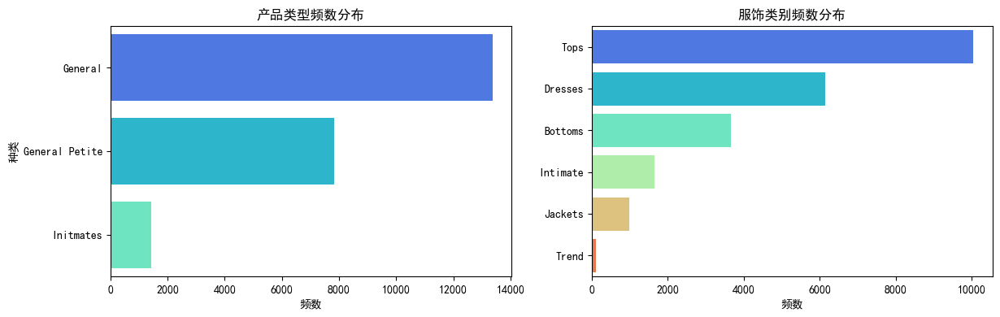

In [109]:
l1 = ['产品类型频数分布','服饰类别频数分布']
row_plots = ["Division Name","Department Name"]
f, axes = plt.subplots(1,len(row_plots), figsize=(14,4), sharex=False)

for i,x in enumerate(row_plots):
    sns.countplot(y=x, data=df,order=df[x].value_counts().index, ax=axes[i])
    axes[i].set_title(l1[i])
    axes[i].set_xlabel("频数")
axes[0].set_ylabel("种类")
axes[1].set_ylabel("")
plt.savefig("HW_yyx_latex/2feature_Name.pdf",dpi=600)

### 多变量分布

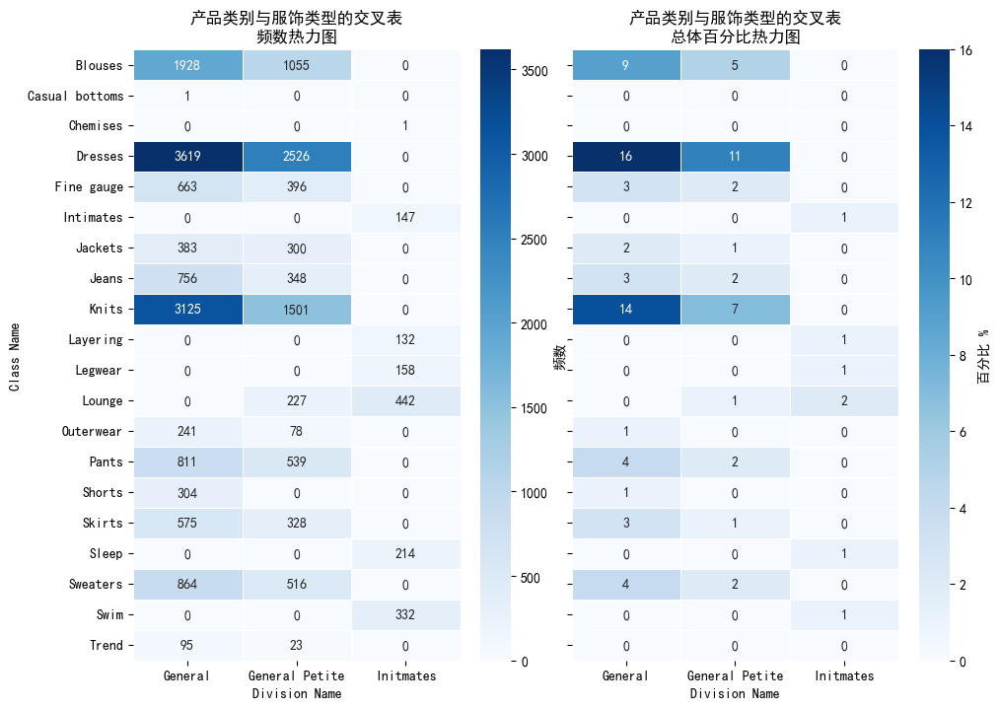

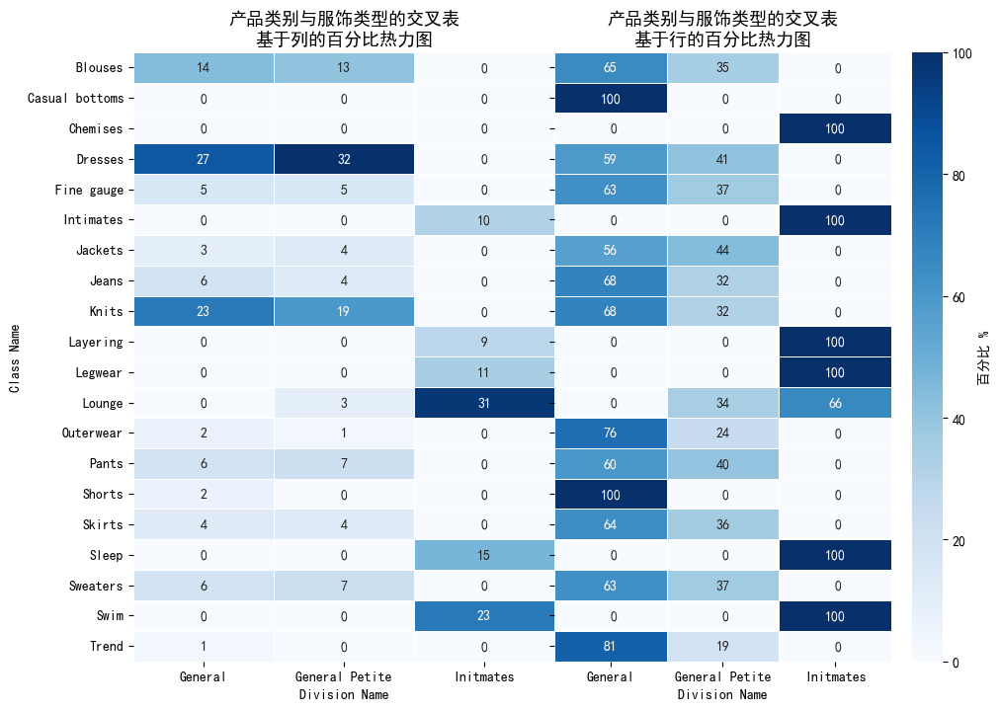

In [122]:
# 交叉热力图
f, ax = plt.subplots(1,2,figsize=(10, 7), sharey=True)
fsize = 13
sns.heatmap(pd.crosstab(df['Class Name'], df["Division Name"]),
            annot=True, linewidths=.5, ax = ax[0],fmt='g', cmap="Blues",
                cbar_kws={'label': '频数'})
ax[0].set_title('产品类别与服饰类型的交叉表\n频数热力图')

sns.heatmap(pd.crosstab(df['Class Name'], df["Division Name"], normalize=True).mul(100).round(0),
            annot=True, linewidths=.5, ax=ax[1],fmt='g', cmap="Blues",
                cbar_kws={'label': '百分比 %'})
ax[1].set_title('产品类别与服饰类型的交叉表\n总体百分比热力图')
ax[1].set_ylabel('')
plt.tight_layout(pad=0)
plt.savefig('HW_yyx_latex/overall.pdf',dpi=600)

# Heatmaps of Percentage Pivot Table
f, ax = plt.subplots(1,2,figsize=(10, 7), sharey=True)
fsize = 13
sns.heatmap(pd.crosstab(df['Class Name'], df["Division Name"], normalize = 'columns').mul(100).round(0)
            ,annot=True, fmt="g", linewidths=.5, ax=ax[0],cbar=False,cmap="Blues")
ax[0].set_title('产品类别与服饰类型的交叉表\n基于列的百分比热力图', fontsize = fsize)
ax[1] = sns.heatmap(pd.crosstab(df['Class Name'], df["Division Name"], normalize = 'index').mul(100).round(0)
            ,annot=True, fmt="2g", linewidths=.5, ax=ax[1],cmap="Blues",
                cbar_kws={'label': '百分比 %'})
ax[1].set_title('产品类别与服饰类型的交叉表\n基于行的百分比热力图', fontsize = fsize)
ax[1].set_ylabel('')
plt.tight_layout(pad=0)
plt.savefig('HW_yyx_latex/basexy.pdf',dpi=600)

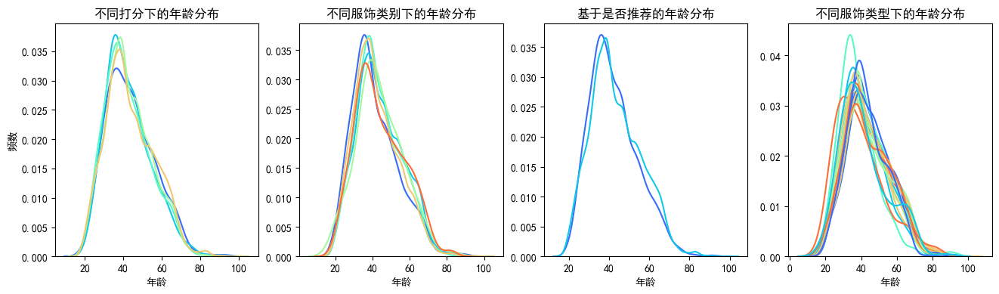

In [136]:
f, axes = plt.subplots(1,4, figsize=(16,4), sharex=False)
l1 = ['不同打分下的年龄分布','不同服饰类别下的年龄分布','基于是否推荐的年龄分布','不同服饰类型下的年龄分布']
xvar = "Age"
plotdf = df["Age"]
for i,y in enumerate(["Rating","Department Name","Recommended IND"]):
    for x in set(df[y][df[y].notnull()]):
        sns.kdeplot(plotdf[df[y]==x], label=x, shade=False, ax=axes[i])
    axes[i].set_xlabel('年龄')
    axes[i].set_label(' ')
    axes[i].set_title(l1[i])

for x in set(df["Class Name"][df["Class Name"].notnull()]):
    sns.kdeplot(plotdf[df["Class Name"]==x], label=x, shade=False, ax=axes[3])


axes[3].set_xlabel('年龄')
axes[0].set_ylabel('频数')
axes[1].set_ylabel('')
axes[2].set_ylabel('')
axes[3].set_ylabel('')
axes[3].set_title(l1[3])
plt.savefig('HW_yyx_latex/age_others.pdf',dpi=600)

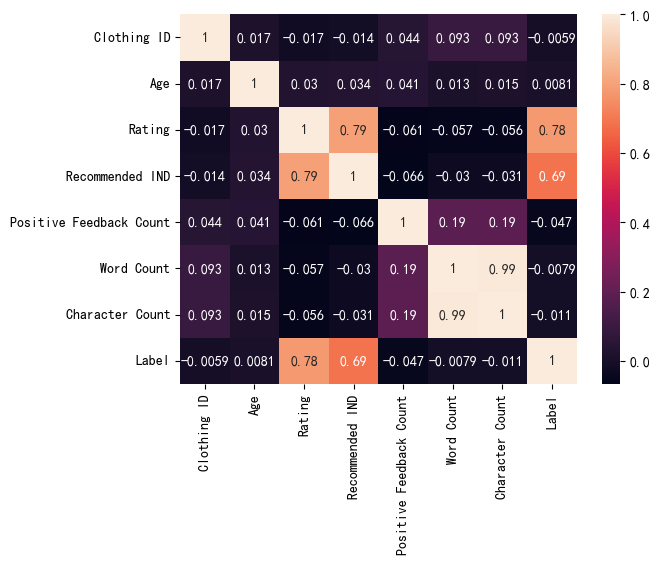

In [144]:
sns.heatmap(df.corr(),annot=True)
plt.savefig('HW_yyx_latex/corr.pdf',dpi=600)

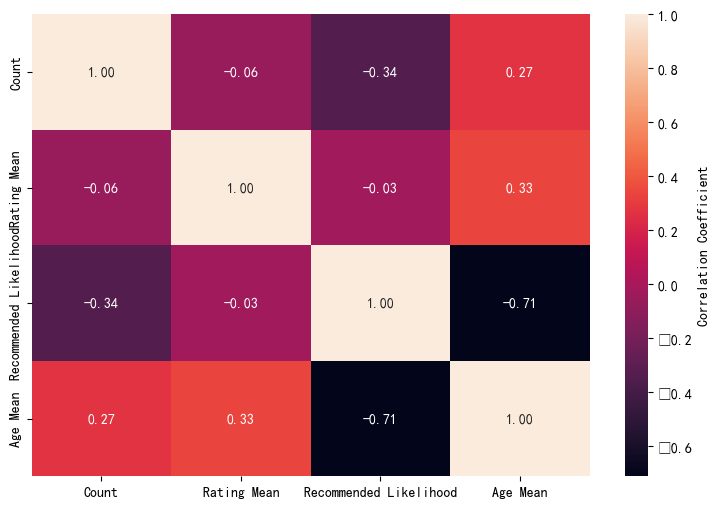

In [23]:
key = "Class Name"
temp = (df.groupby(key)[["Rating","Recommended IND", "Age"]]
        .aggregate(['count','mean']))
temp.columns = ["Count","Rating Mean","Recommended Likelihood Count",
                "Recommended Likelihood","Age Count","Age Mean"]
temp.drop(["Recommended Likelihood Count","Age Count"], axis=1, inplace =True)

f, ax = plt.subplots(figsize=[9,6])
ax = sns.heatmap(temp.corr()
    , annot=True, fmt=".2f",cbar_kws={'label': 'Correlation Coefficient'})
plt.savefig('HW_yyx_latex/corr2.pdf',dpi=600)


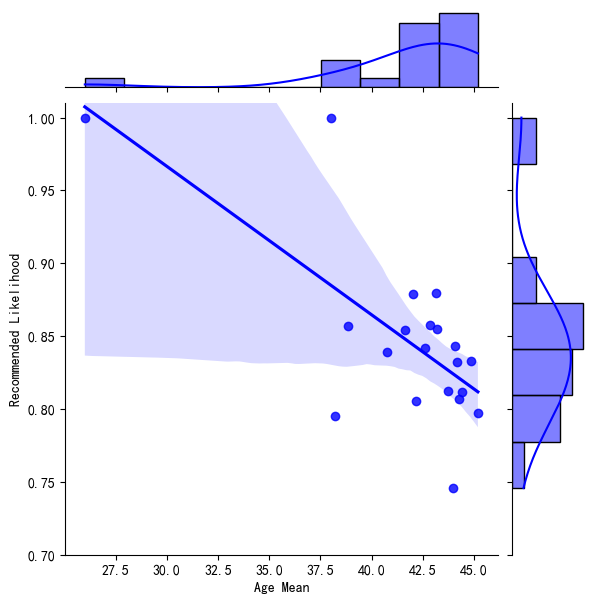

In [148]:
# 线性回归模型
model_fit = sm.OLS(temp["Recommended Likelihood"],
               sm.add_constant(temp["Age Mean"])).fit() 
temp['resid'] = model_fit.resid

#绘图
g = sns.jointplot(y="Recommended Likelihood",x='Age Mean',data=temp,
                  kind='reg', color='b')
plt.subplots_adjust(top=0.999)
plt.ylim(.7, 1.01)

#侧面直方图绘制
head = temp.sort_values(by=['resid'], ascending=[False]).head(2)
tail = temp.sort_values(by=['resid'], ascending=[False]).tail(2)

def ann(row):
    ind = row[0]
    r = row[1]
    plt.gca().annotate(ind, xy=( r["Age Mean"], r["Recommended Likelihood"]), 
            xytext=(2,2) , textcoords ="offset points", )

for row in head.iterrows():
    ann(row)
for row in tail.iterrows():
    ann(row)

plt.xlabel('平均年龄')
plt.ylabel('推荐可能性')
plt.savefig('HW_yyx_latex/corr3.pdf',dpi=600)
del head, tail


### 情感分析

In [6]:
import nltk
nltk.find('.')

FileSystemPathPointer('C:\\Users\\sty007\\AppData\\Roaming\\nltk_data')

In [7]:
from nltk.stem.lancaster import LancasterStemmer
from nltk.stem.porter import PorterStemmer
ps = PorterStemmer()
tokenizer = RegexpTokenizer(r'\w+')
stop_words = set(stopwords.words('english'))
def preprocessing(data):
    txt = data.str.lower().str.cat(sep=' ') #1
    words = tokenizer.tokenize(txt) #2
    words = [w for w in words if not w in stop_words] #3
    #words = [ps.stem(w) for w in words] #4
    return words

In [8]:
# 利用Vader进行情感分析
SIA = SentimentIntensityAnalyzer()
df["Review Text"]= df["Review Text"].astype(str)

# 应用预训练模型创造新变量
df['Polarity Score']=df["Review Text"].apply(lambda x:SIA.polarity_scores(x)['compound'])
df['Neutral Score']=df["Review Text"].apply(lambda x:SIA.polarity_scores(x)['neu'])
df['Negative Score']=df["Review Text"].apply(lambda x:SIA.polarity_scores(x)['neg'])
df['Positive Score']=df["Review Text"].apply(lambda x:SIA.polarity_scores(x)['pos'])

# 最终的情感变量
df['Sentiment']=''
df.loc[df['Polarity Score']>0,'Sentiment']='Positive'
df.loc[df['Polarity Score']==0,'Sentiment']='Neutral'
df.loc[df['Polarity Score']<0,'Sentiment']='Negative'

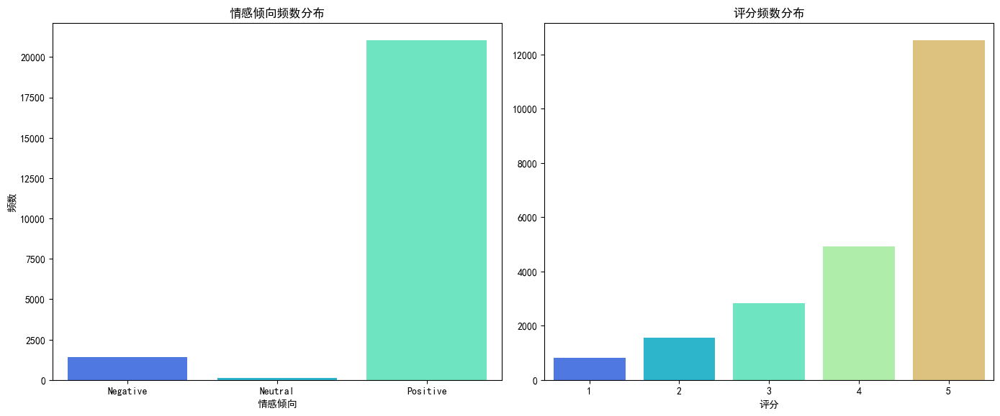

In [14]:
#可视化
f, axes = plt.subplots(1,2, figsize=[14,6])
sns.countplot(x="Sentiment", data=df, ax=axes[0], order=["Negative","Neutral","Positive"])
axes[0].set_xlabel("情感倾向")
axes[0].set_ylabel("频数")
axes[0].set_title("情感倾向频数分布")

sns.countplot(x="Rating", data=df, ax=axes[1])
axes[1].set_xlabel("评分")
axes[1].set_ylabel("")
axes[1].set_title("评分频数分布")

f.tight_layout()
f.subplots_adjust(top=0.92)
plt.savefig('HW_yyx_latex/sentirate.pdf',dpi=600)

In [9]:
df.sample(1)

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Word Count,Character Count,Label,Polarity Score,Neutral Score,Negative Score,Positive Score,Sentiment
18380,933,39,NaN,"Great sweater. long and warm, but not too thic...",5,1,0,General Petite,Tops,Sweaters,20,103,1,0.7814,0.656,0.0,0.344,Positive


## 词云图

In [213]:
stopwords = set(STOPWORDS)
size = (10,7)

def cloud(text, path , stopwords=stopwords, size=size ):
    # 绘图参数
    mpl.rcParams['figure.figsize']=(10.0,10.0)
    mpl.rcParams['font.size']=12
    mpl.rcParams['savefig.dpi']=600
    mpl.rcParams['figure.subplot.bottom']=.1 
    
    # 对单词进行预处理
    wordcloud = WordCloud(width=1600, height=800,
                          background_color='white',
                          stopwords=stopwords,
                         ).generate(str(text))
    
    # 输出
    fig = plt.figure(figsize=size, dpi=600, facecolor='k',edgecolor='k')
    plt.imshow(wordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.savefig(path)
    
# 利用[One-Gram]计算累计频数
def wordfreqviz(text, x):
    word_dist = nltk.FreqDist(text)
    top_N = x
    rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
    mpl.style.use('ggplot')
    rslt.plot.bar(rot=0)

def wordfreq(text, x):
    word_dist = nltk.FreqDist(text)
    top_N = x
    rslt = pd.DataFrame(word_dist.most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
    return rslt

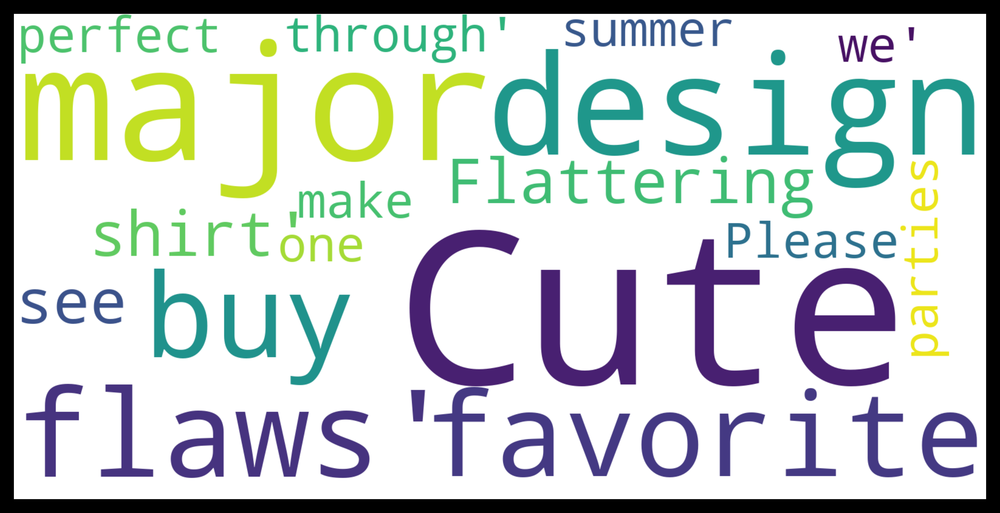

In [214]:
new_stop = set(STOPWORDS)
new_stop.update([x.lower() for x in list(df["Class Name"][df["Class Name"].notnull()].unique())]
                + ["dress", "petite"])
cloud(text= df.Title[df.Title.notnull()].astype(str).values,
      path = 'HW_yyx_latex/cloud_title.png',
      stopwords= new_stop,
      size = (7,4))

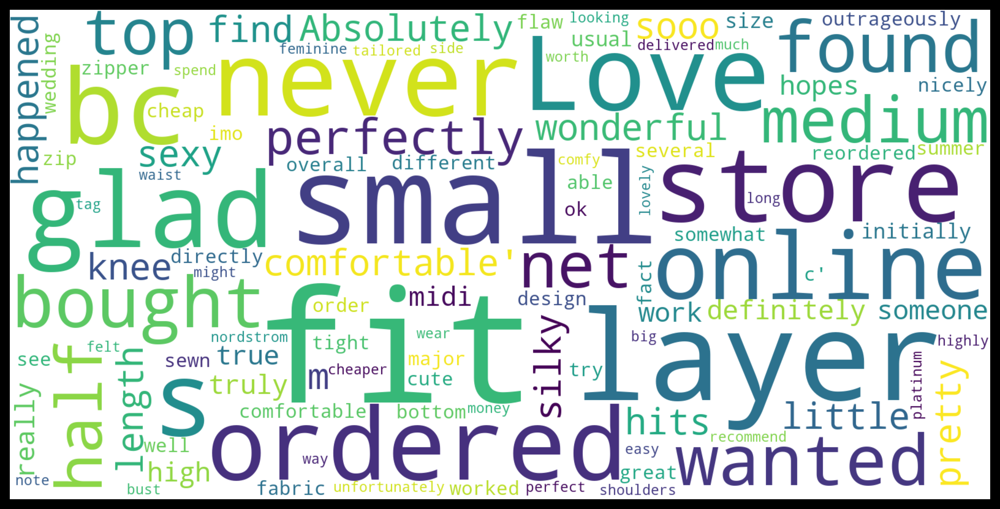

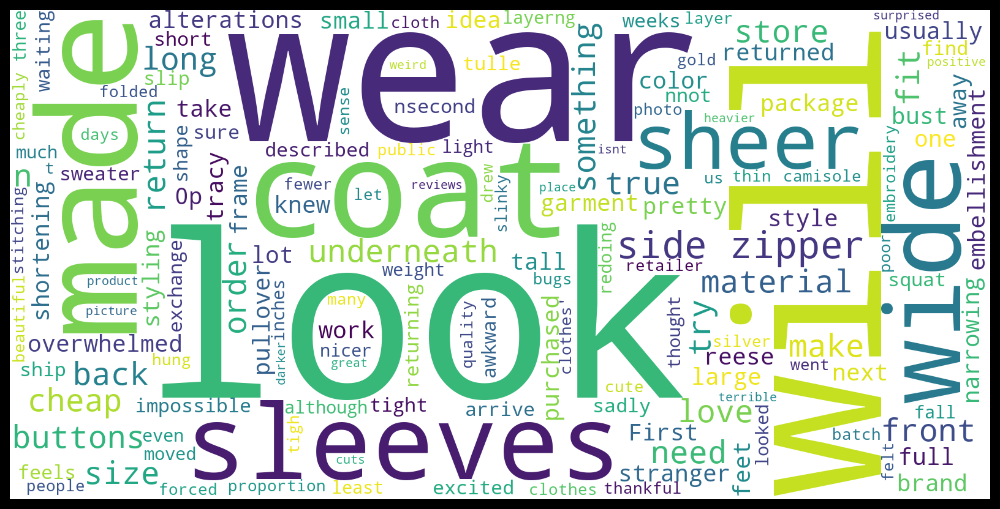

In [218]:
# 高评分词云图
title ="Highly Rated Comments"
temp = df['Review Text'][df.Rating.astype(int) >= 3]
new_stop = set(STOPWORDS)
new_stop.update([x.lower() for x in list(df["Class Name"][df["Class Name"].notnull()].unique())]
                + ["dress", "petite"])
cloud(text= temp.values, path='HW_yyx_latex/cloud_ratehighly.png',stopwords= new_stop)

# 低评分词云图
title ="Most Frequent Words in Low Rated Comments"
temp = df['Review Text'][df.Rating.astype(int) < 3]
new_stop = set(STOPWORDS)
new_stop.update([x.lower() for x in list(df["Class Name"][df["Class Name"].notnull()].unique())]
                + ["dress", "petite", "skirt","shirt"])
cloud(temp.values, path='HW_yyx_latex/cloud_ratelow.png', stopwords = new_stop)

## 监督学习-logistic&lightgbm

In [29]:
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import FeatureUnion
from sklearn.utils import shuffle
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from scipy.sparse import hstack, csr_matrix
import eli5
import lightgbm as lgb
import shap

In [33]:
#数据转换
vect = TfidfVectorizer()
vect.fit(df["Review Text"])
X = vect.transform(df["Review Text"])
y = df["Recommended IND"].copy()
X_train, X_valid, y_train, y_valid = train_test_split(
    X, y, test_size=0.20, random_state=23, stratify=y)
#g构建模型
model = LogisticRegression(random_state=1)
model.fit(X_train, y_train)
print("Traindata Accuracy: {}".format(metrics.accuracy_score(model.predict(X_train), y_train)))
print("Traindata ROC: {}\n".format(metrics.roc_auc_score(model.predict(X_train), y_train)))
print("Validationdata Accuracy: {}".format(metrics.accuracy_score(model.predict(X_valid), y_valid)))
print("Validationdata ROC: {}".format(metrics.roc_auc_score(model.predict(X_valid), y_valid)))
print(metrics.classification_report(model.predict(X_valid), y_valid))

Traindata Accuracy: 0.9128273118992376
Traindata ROC: 0.8887917239773266

Validationdata Accuracy: 0.8912947414935926
Validationdata ROC: 0.842036818826101
              precision    recall  f1-score   support

           0       0.56      0.78      0.65       596
           1       0.96      0.91      0.94      3930

    accuracy                           0.89      4526
   macro avg       0.76      0.84      0.79      4526
weighted avg       0.91      0.89      0.90      4526



In [11]:
target_names = ["Not Recommended","Recommended"]
eli5.show_weights(model, vec=vect, top=100,
                  target_names=target_names)

Weight?,Feature
+5.655,love
+5.176,perfect
+4.627,great
+4.527,little
+4.166,comfortable
+3.789,with
+3.490,soft
+3.319,compliments
+3.259,fits
+2.855,bit


In [13]:
for iteration in range(15):
    samp = random.randint(1,df.shape[0])
    print("Real Label: {}".format(df["Recommended IND"].iloc[samp]))
    display(eli5.show_prediction(model,df["Review Text"].iloc[samp], vec=vect,
                         target_names=target_names))

Real Label: 1


Real Label: 1


Real Label: 1


Real Label: 0


Real Label: 1


Real Label: 1


Real Label: 1


Real Label: 0


Real Label: 1


Real Label: 1


Real Label: 1


Real Label: 1


Real Label: 1


Real Label: 1


Real Label: 1


## lightgbm

In [35]:
lgbm_params = {
        "objective": "binary",
        'metric': {'auc'},
        "boosting_type": "gbdt",
        "num_threads": 4,
        "bagging_fraction": 0.8,
        "feature_fraction": 0.8,
        "learning_rate": 0.1,
        "num_leaves": 31,
        "min_split_gain": .1,
        "reg_alpha": .1
    }

lgtrain = lgb.Dataset(X_train, y_train,
                feature_name=vect.get_feature_names())
lgvalid = lgb.Dataset(X_valid, y_valid,
                feature_name=vect.get_feature_names())
                
lgb_clf = lgb.train(
    lgbm_params,
    lgtrain,
    num_boost_round=2000,
    valid_sets=[lgtrain, lgvalid],
    valid_names=['train','valid'],
    early_stopping_rounds=150,
    verbose_eval=100
)

[LightGBM] [Info] Number of positive: 14821, number of negative: 3281
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 135028
[LightGBM] [Info] Number of data points in the train set: 18102, number of used features: 2210
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.818749 -> initscore=1.507897
[LightGBM] [Info] Start training from score 1.507897
Training until validation scores don't improve for 150 rounds
[100]	train's auc: 0.986764	valid's auc: 0.922121
[200]	train's auc: 0.998133	valid's auc: 0.925762
[300]	train's auc: 0.999859	valid's auc: 0.925482
[400]	train's auc: 0.999995	valid's auc: 0.926344
[500]	train's auc: 1	valid's auc: 0.926553
[600]	train's auc: 1	valid's auc: 0.926843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

In [36]:
valid_pred = lgb_clf.predict(X_valid)
_thresh = []
for thresh in np.arange(0.1, 0.501, 0.01):
    _thresh.append([thresh, metrics.f1_score(y_valid, (valid_pred>thresh).astype(int))])
#     print("F1 score at threshold {0} is {1}".format(thresh, metrics.f1_score(y_valid, (valid_pred>thresh).astype(int))))

_thresh = np.array(_thresh)
best_id = _thresh[:,1].argmax()
best_thresh = _thresh[best_id][0]
print("F1 Score: {}".format( _thresh[best_id][1]))

F1 Score: 0.9365184109805992


In [ ]:
shap.initjs()
non_sparse = pd.DataFrame(vect.transform(df['Review Text']).toarray(), columns = vect.get_feature_names())
explainer = shap.TreeExplainer(lgb_clf)
shap_values = explainer.shap_values(non_sparse)

In [ ]:
#所有影响因子
shap.summary_plot(shap_values, non_sparse)

In [ ]:
# 变量解释可视化
for iteration in range(15):
    samp = random.randint(1,df.shape[0])
    print("Real Label: {}".format(df["Recommended IND"].iloc[samp]))
    display(df["Review Text"].iloc[samp])
    display(shap.force_plot(explainer.expected_value, shap_values[samp,:], non_sparse.iloc[samp,:]))